In [1]:
from sklearn.cluster import KMeans
from sklearn.datasets import load_wine
import numpy as np
from matplotlib import pyplot as plt
from sklearn.metrics import silhouette_samples
from matplotlib import cm
import PIL.Image as pilimg
import warnings
warnings.filterwarnings(action='ignore') 

In [2]:
wine = load_wine()
wine.feature_names, wine.target_names

(['alcohol',
  'malic_acid',
  'ash',
  'alcalinity_of_ash',
  'magnesium',
  'total_phenols',
  'flavanoids',
  'nonflavanoid_phenols',
  'proanthocyanins',
  'color_intensity',
  'hue',
  'od280/od315_of_diluted_wines',
  'proline'],
 array(['class_0', 'class_1', 'class_2'], dtype='<U7'))

In [3]:
Xall=wine["data"] 
y=wine["target"]

# 1. wine data plot

와인 데이터를 모두 plot했고, 결과는 아래와 같다.

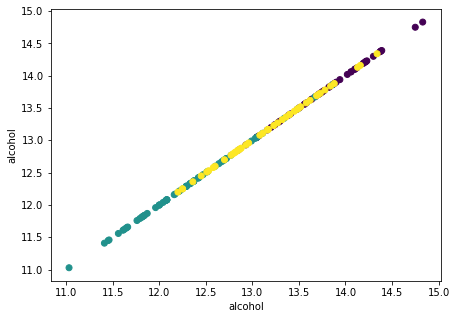

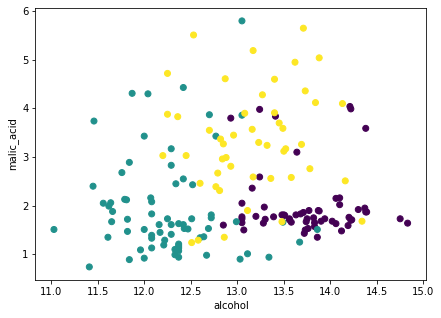

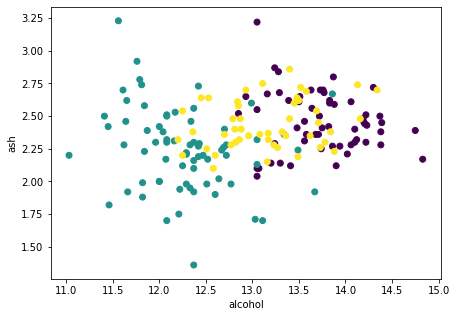

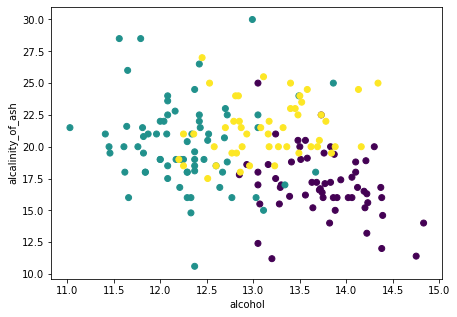

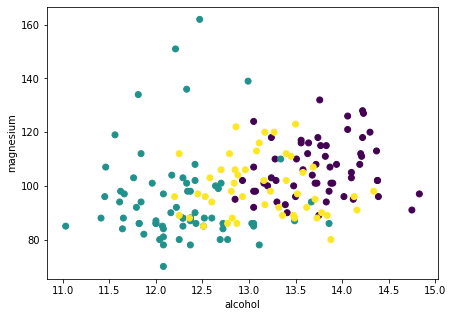

...

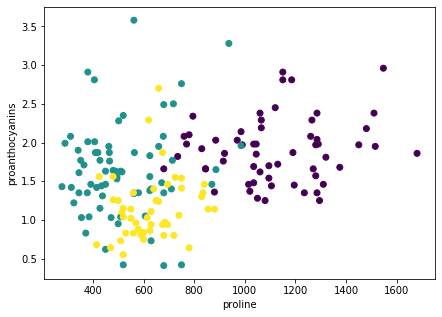

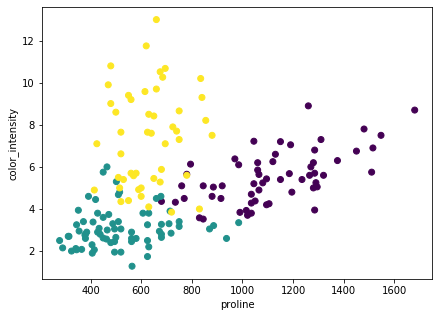

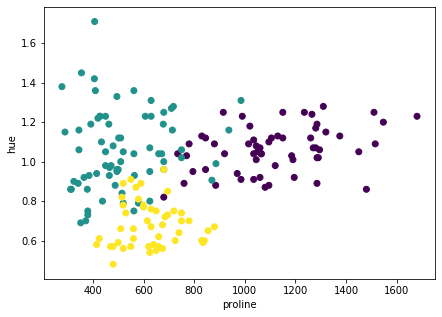

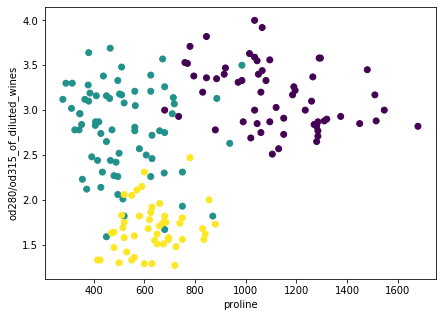

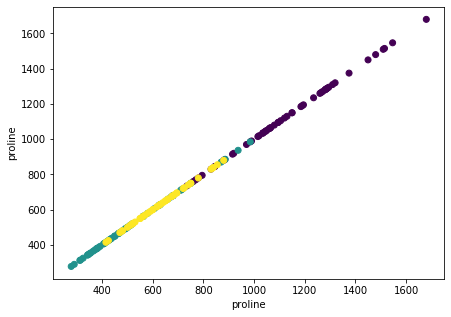

In [4]:
for j in range(13):
    for i in range(13):
        plt.figure(figsize=(7,5))
        plt.xlabel(wine.feature_names[j])
        plt.ylabel(wine.feature_names[i])
        plt.scatter(Xall[:,j],Xall[:,i],c=y)
        #plt.savefig('./winedata/standard/'+str(j)+'_'+str(i)+'.jpg')

# 2. kmeans clustering

와인 데이터를 전부 kmeans clustering 했다. 클래스의 종류가 3개이므로 클러스터는 3, 다른 centroid로 fit하는 횟수는 10회, 초기화는 랜덤으로, 최대 300회 반복하도록 설정했다.

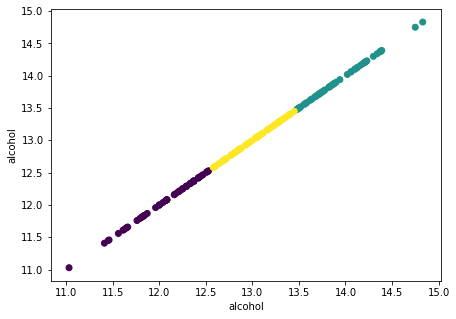

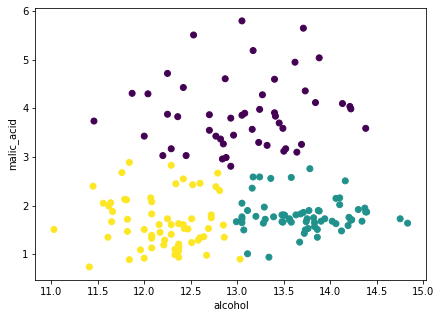

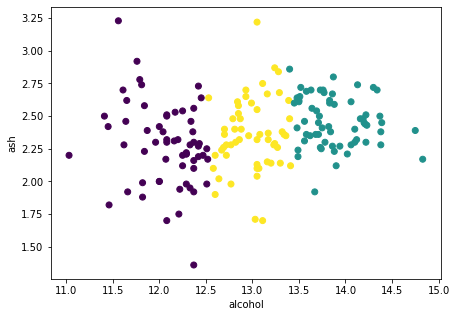

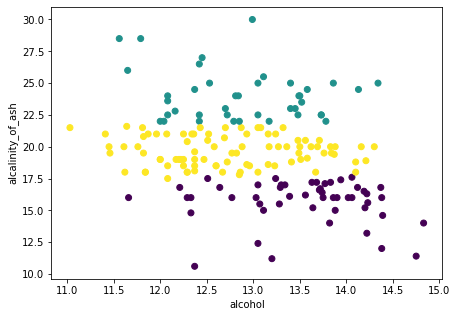

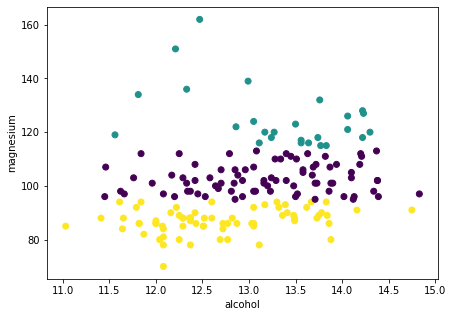

...

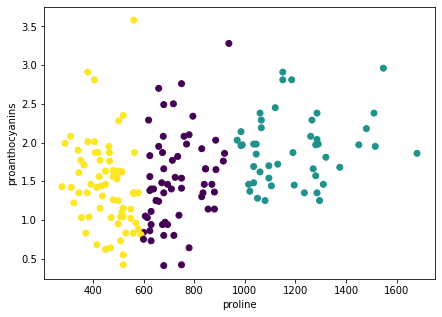

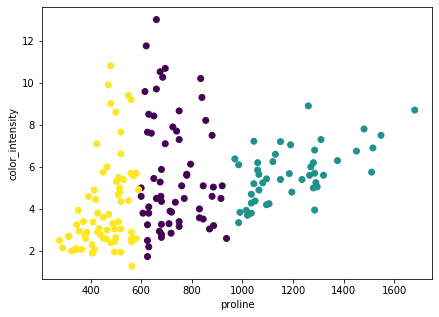

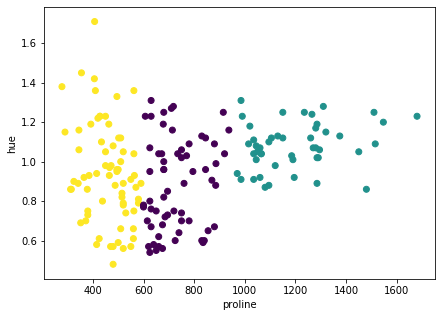

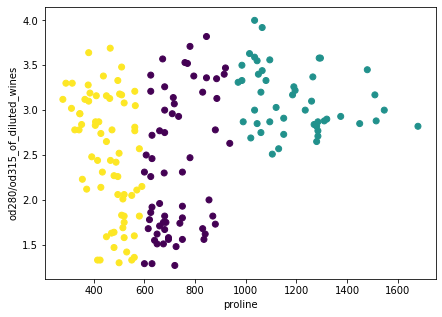

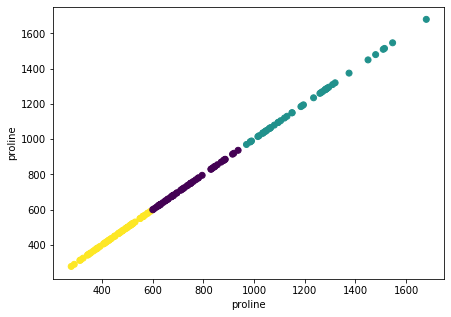

In [6]:
kmeans = KMeans(n_clusters=3,init='random',n_init=10,max_iter=300)

for j in range(13):
    for i in range(13):
        data=np.transpose([Xall[:,j],Xall[:,i]])
        kmeans.fit(data)
        plt.figure(figsize=(7,5))
        plt.xlabel(wine.feature_names[j])
        plt.ylabel(wine.feature_names[i])
        plt.scatter(Xall[:,j],Xall[:,i],c=kmeans.labels_)
        #plt.savefig('./winedata/kmeans/'+str(j)+'_'+str(i)+'.jpg')

# 3. kmeans clustering sillhouette score

최적의 클러스터 갯수를 찾기 위해 sillhouette score를 이용하는데, 와인 데이터는 클래스가 3개임을 알고 있으므로 클러스터가 3개일 때 coefficient값이 높은 것이 clustering이 잘 된 결과물임을 알 수 있다. 데이터 중 같은 값끼리 계산한 결과는 제외했다.

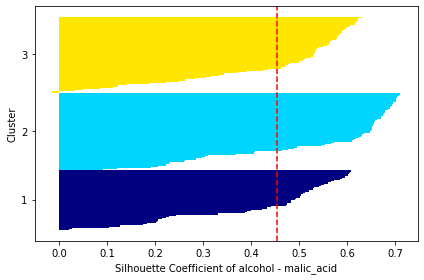

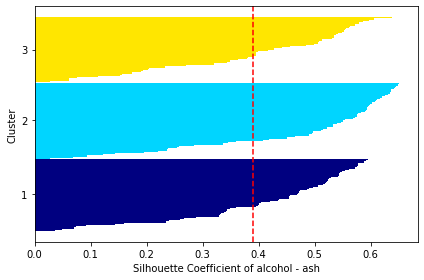

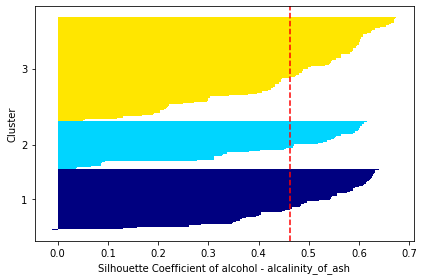

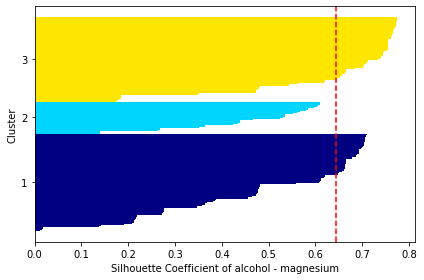

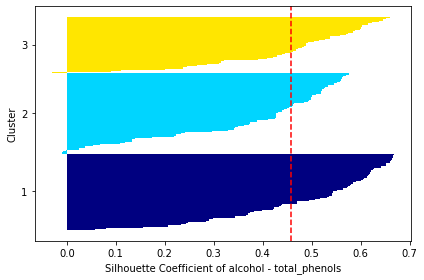

...

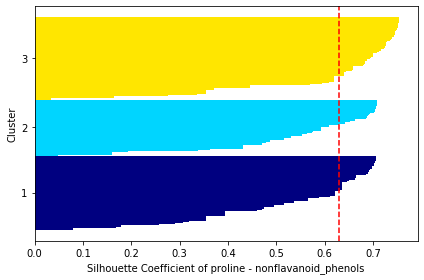

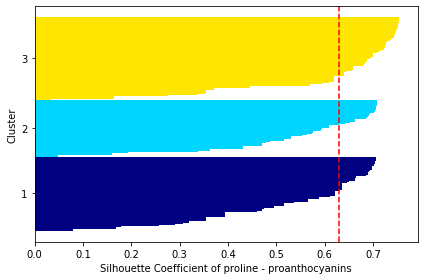

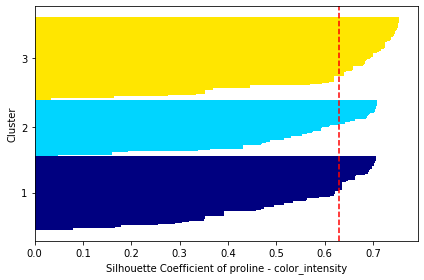

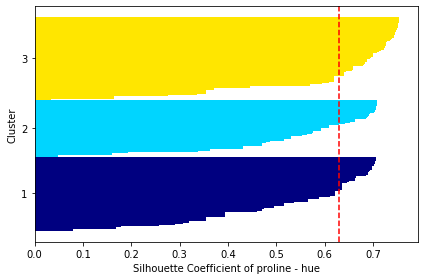

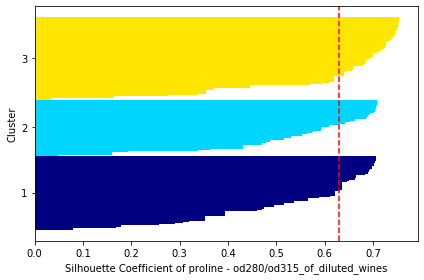

In [126]:
kmeans_avg=[]

for j in range(13):
    for k in range(13):
        if j==k:
            continue
        else:      
            data=np.transpose([Xall[:,j],Xall[:,k]])
            pred=kmeans.fit_predict(data)
    
            cluster_labels = np.unique(pred)
            n_clusters = cluster_labels.shape[0]
            silhouette_vals = silhouette_samples(data, pred, metric='euclidean')

            y_ax_lower, y_ax_upper = 0, 0
            yticks = []

            for i, c in enumerate(cluster_labels):
                c_silhouette_vals = silhouette_vals[pred == c]
                c_silhouette_vals.sort()
                y_ax_upper += len(c_silhouette_vals)
                color = cm.jet(float(i) / n_clusters)

                plt.barh(range(y_ax_lower, y_ax_upper),c_silhouette_vals,height=1.0,edgecolor='none',color=color)
                yticks.append((y_ax_upper + y_ax_lower) / 2.)
                y_ax_lower += len(c_silhouette_vals)

            silhouette_avg = np.mean(c_silhouette_vals)
            kmeans_avg.append(silhouette_avg)
            plt.axvline(silhouette_avg, color='red', linestyle='--')
            plt.yticks(yticks, cluster_labels + 1)
            plt.ylabel('Cluster')
            plt.xlabel('Silhouette Coefficient of '+wine.feature_names[j]+' - '+wine.feature_names[k])
            plt.savefig('./winedata/sil/'+str(j)+'_'+str(k)+'.jpg')
            plt.tight_layout()
            plt.show()

# 4. discussion

In [170]:
avg=[]
for i in range(13):
    avg.append(np.mean(kmeans_avg[12*i:12*(i+1)]))
max(avg),avg.index(max(avg))

(0.6298610387565269, 12)

kmeans clustering을 sillhouette 기법으로 평가한 결과, 13번째 항목인 proline과 각 항목들을 기준으로 clustering한 경우의 score 평균이 가장 높았다. proline을 기준으로 clustering한 결과와 sillhouette 기법으로 평가한 결과는 아래와 같다.

### 4.1 kmeans clustering of proline

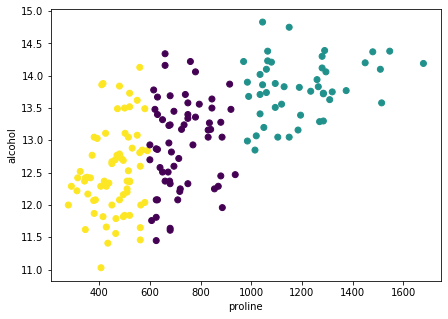

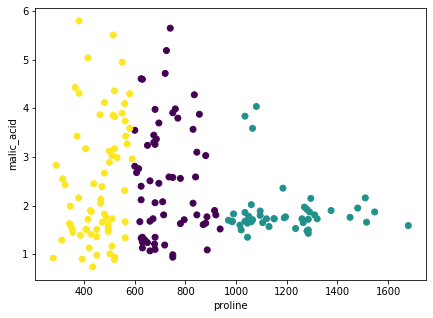

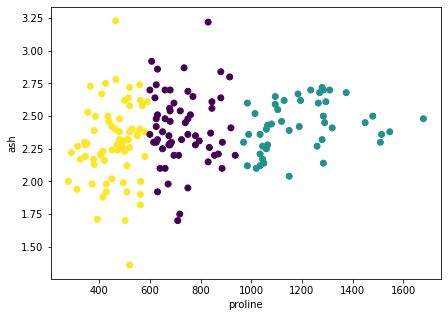

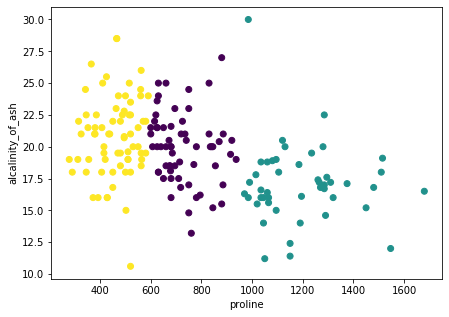

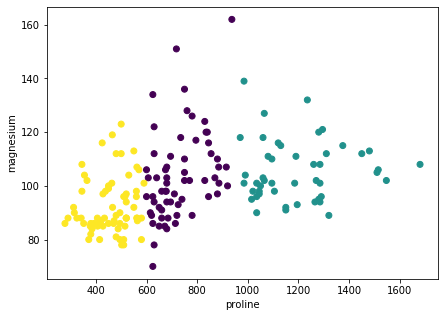

...

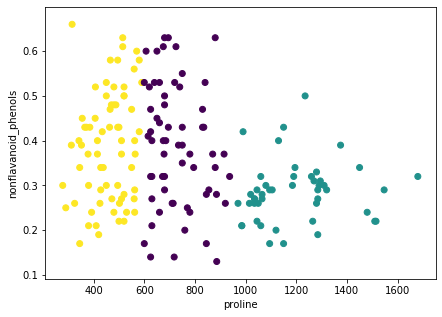

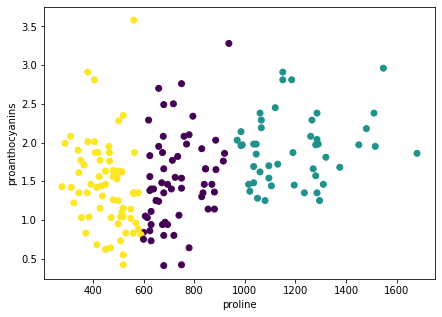

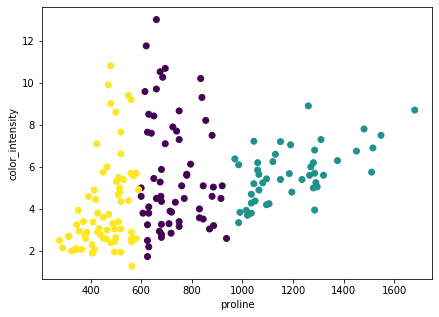

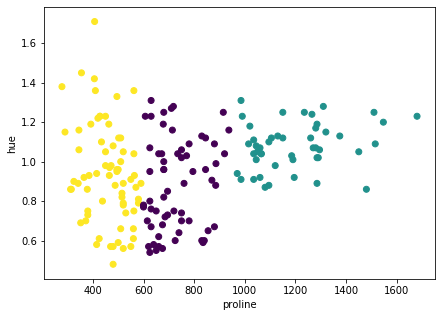

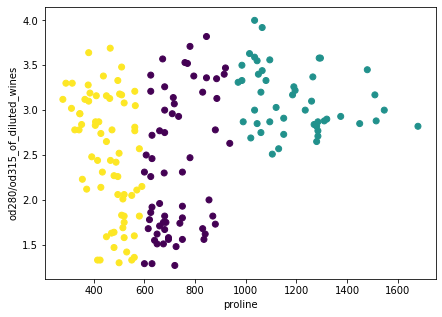

In [173]:
for i in range(12):
    if i==12:
        continue
    else:
        data=np.transpose([Xall[:,12],Xall[:,i]])
        kmeans.fit(data)
        plt.figure(figsize=(7,5))
        plt.xlabel(wine.feature_names[12])
        plt.ylabel(wine.feature_names[i])
        plt.scatter(Xall[:,12],Xall[:,i],c=kmeans.labels_)
        plt.savefig('./winedata/conc/'+'kmeans_'+str(12)+'_'+str(i)+'.jpg')

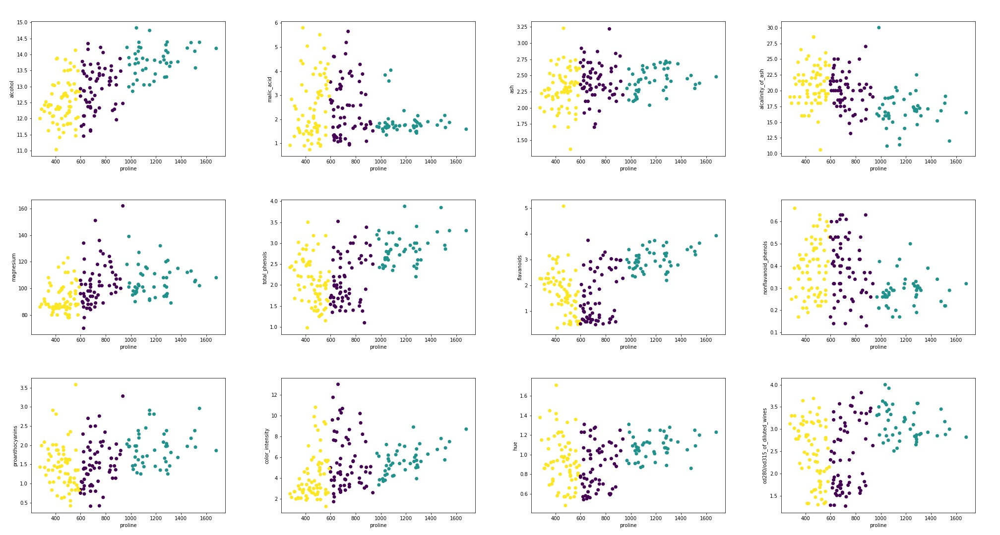

In [175]:
pilimg.open('./conc_kmeans.jpg')

### 4.2 sillhouette score of proline

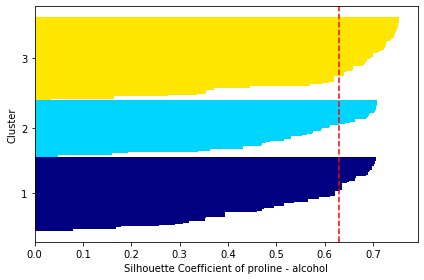

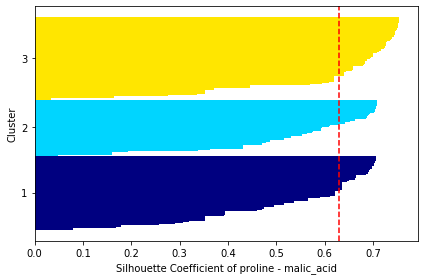

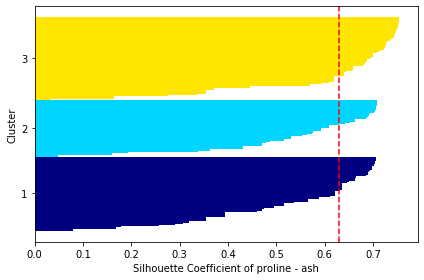

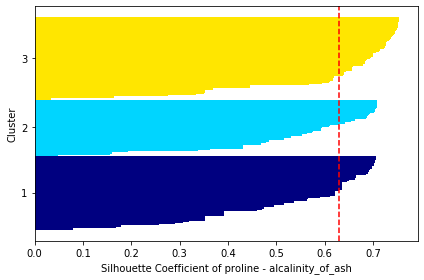

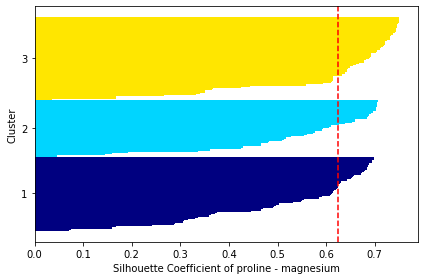

...

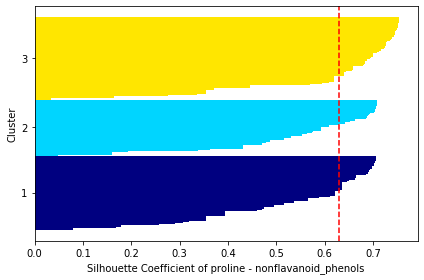

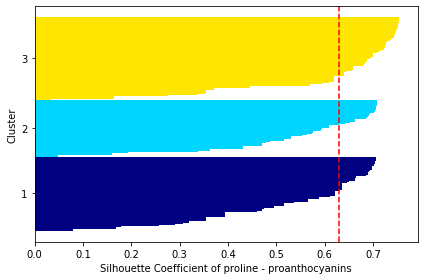

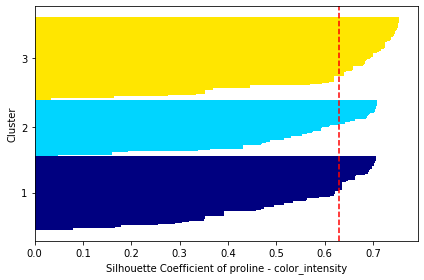

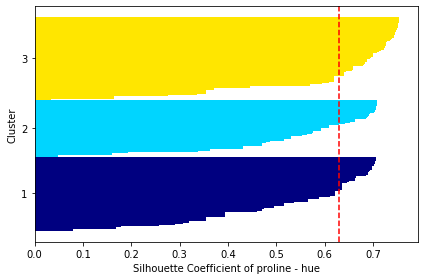

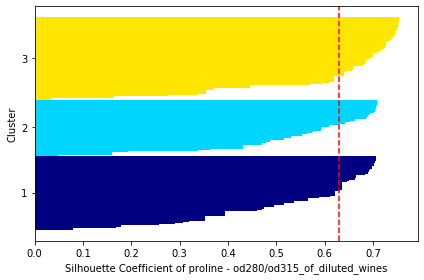

In [177]:
proline=[]
for k in range(12):
    if j==k:
        continue
    else:      
        data=np.transpose([Xall[:,12],Xall[:,k]])
        pred=kmeans.fit_predict(data)
    
        cluster_labels = np.unique(pred)
        n_clusters = cluster_labels.shape[0]
        silhouette_vals = silhouette_samples(data, pred, metric='euclidean')

        y_ax_lower, y_ax_upper = 0, 0
        yticks = []

        for i, c in enumerate(cluster_labels):
            c_silhouette_vals = silhouette_vals[pred == c]
            c_silhouette_vals.sort()
            y_ax_upper += len(c_silhouette_vals)
            color = cm.jet(float(i) / n_clusters)

            plt.barh(range(y_ax_lower, y_ax_upper),c_silhouette_vals,height=1.0,edgecolor='none',color=color)
            yticks.append((y_ax_upper + y_ax_lower) / 2.)
            y_ax_lower += len(c_silhouette_vals)

        silhouette_avg = np.mean(c_silhouette_vals)
        proline.append(silhouette_avg)
        plt.axvline(silhouette_avg, color='red', linestyle='--')
        plt.yticks(yticks, cluster_labels + 1)
        plt.ylabel('Cluster')
        plt.xlabel('Silhouette Coefficient of '+wine.feature_names[12]+' - '+wine.feature_names[k])
        #plt.savefig('./winedata/conc/'+'sill_'+str(12)+'_'+str(k)+'.jpg')
        plt.tight_layout()
        plt.show()

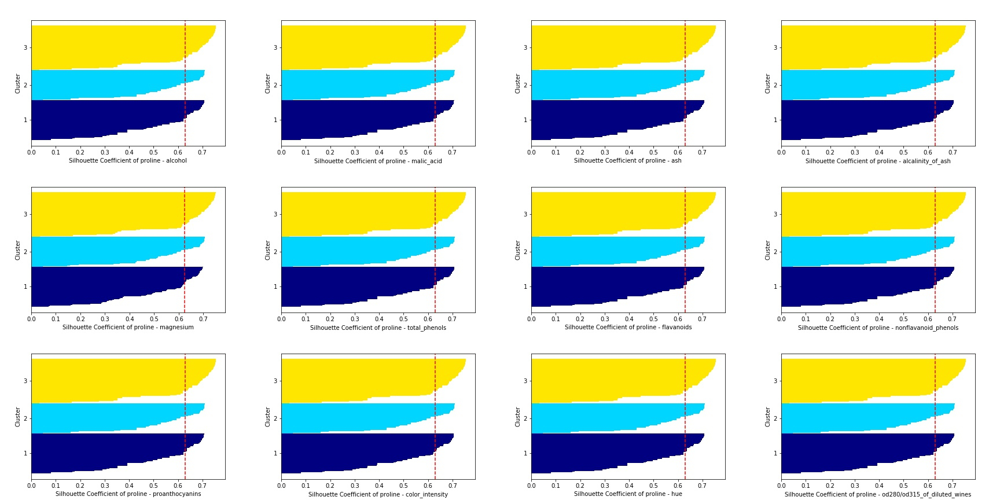

In [176]:
pilimg.open('./conc_sill.jpg')

### 4.3 best sillhouette score

In [182]:
max(proline),proline.index(max(proline))

(0.6306711363530803, 7)

sillhouette 기법으로 평가한 결과 proline-nonflavanoid_phenols 항목이 약 0.63으로 가장 높은 score를 얻었으며, kmeans clustering을 통해 가장 좋은 결과를 얻는 데이터라고 결론지을 수 있다. 실제로 모든 cluster의 coefficient가 고르게 1에 가까우며, 이는 적절한 sillhouette score의 지표에 해당된다. 따라서 proline-nonflavanoid_phenols 데이터를 토대로 clustering한 결과물이 와인 데이터를 가장 정확히 kmeans clustering한 것이다. 해당 데이터의 ploting은 아래와 같다.

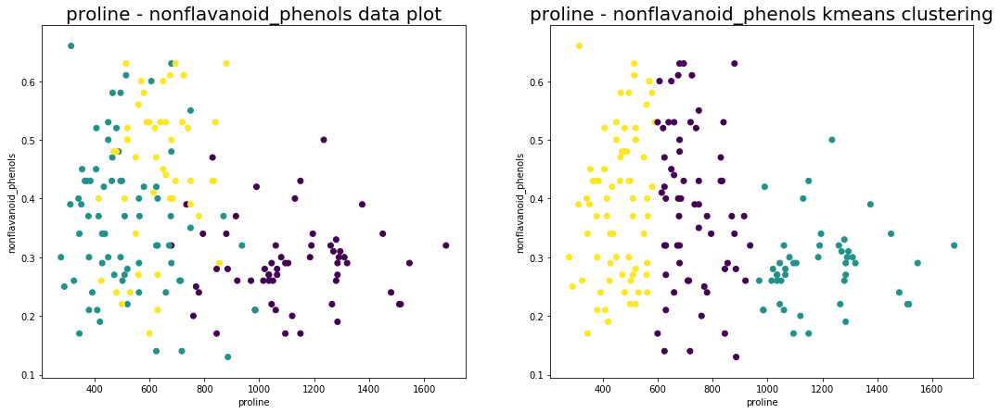

In [214]:
plt.figure(figsize=(18,7))
plt.subplot(121)
plt.title(wine.feature_names[12]+' - '+wine.feature_names[7]+' data plot')
plt.xlabel(wine.feature_names[12])
plt.ylabel(wine.feature_names[7])
plt.scatter(Xall[:,12],Xall[:,7],c=y)

data=np.transpose([Xall[:,12],Xall[:,7]])
kmeans.fit(data)
plt.subplot(122)
plt.title(wine.feature_names[12]+' - '+wine.feature_names[7]+' kmeans clustering')
plt.xlabel(wine.feature_names[12])
plt.ylabel(wine.feature_names[7])
plt.scatter(Xall[:,12],Xall[:,7],c=kmeans.labels_)

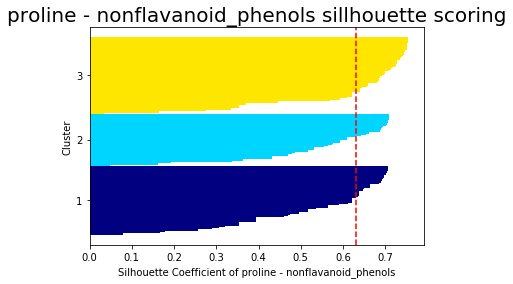

<Figure size 1440x504 with 0 Axes>

(None, 0.6306711363530803)

In [212]:
data=np.transpose([Xall[:,12],Xall[:,7]])
pred=kmeans.fit_predict(data)
    
cluster_labels = np.unique(pred)
n_clusters = cluster_labels.shape[0]
silhouette_vals = silhouette_samples(data, pred, metric='euclidean')

y_ax_lower, y_ax_upper = 0, 0
yticks = []

for i, c in enumerate(cluster_labels):
    c_silhouette_vals = silhouette_vals[pred == c]
    c_silhouette_vals.sort()
    y_ax_upper += len(c_silhouette_vals)
    color = cm.jet(float(i) / n_clusters)

    plt.barh(range(y_ax_lower, y_ax_upper),c_silhouette_vals,height=1.0,edgecolor='none',color=color)
    yticks.append((y_ax_upper + y_ax_lower) / 2.)
    y_ax_lower += len(c_silhouette_vals)

silhouette_avg = np.mean(c_silhouette_vals)
plt.axvline(silhouette_avg, color='red', linestyle='--')
plt.rc('figure', titlesize=12)
plt.title(wine.feature_names[12]+' - '+wine.feature_names[7]+' sillhouette scoring')
plt.yticks(yticks, cluster_labels + 1)
plt.ylabel('Cluster')
plt.xlabel('Silhouette Coefficient of '+wine.feature_names[12]+' - '+wine.feature_names[7])
plt.figure(figsize=(20,7))
plt.tight_layout()
plt.show(),silhouette_avg